https://levelup.gitconnected.com/how-to-split-an-image-into-patches-with-python-e1cf42cf4f77

In [69]:
import numpy as np
from patchify import patchify
import PIL
import matplotlib.pyplot as plt

In [70]:
PIL.Image.MAX_IMAGE_PIXELS = 933120000

In [71]:
tif_map = PIL.Image.open("data/test_map.tif")
tif_map_np = np.array(tif_map)

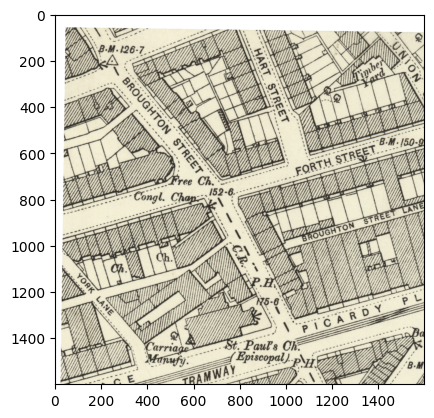

In [72]:
fig, ax = plt.subplots()
ax.imshow(tif_map_np[400:2000, 900:2500, :])
plt.show()

In [120]:
def get_map_patches(file_name, patch_width):
    tif_map = PIL.Image.open(file_name)
    tif_map_np = np.array(tif_map)
    tif_map_patches = patchify(image = tif_map_np, 
                               patch_size = (patch_width, patch_width, 3),
                               step = patch_width)
    
    print(f"Patches generated with shape: {tif_map_patches.shape}")
    
    return tif_map_np, tif_map_patches

In [123]:
def plot_map_patches(file_name, patch_width, samples):
    tif_map_np, tif_map_patches = get_map_patches(file_name, patch_width)
    
    row_indices = np.random.randint(0,tif_map_patches.shape[0],samples)
    col_indices = np.random.randint(0,tif_map_patches.shape[1],samples)

    fig, ax = plt.subplots(samples, samples, figsize = (6*samples,6*samples))

    for i in range(samples):
        for j in range(samples):
            row = row_indices[i]
            col = col_indices[j]
            ax[i,j].imshow(tif_map_patches[row, col, 0])

    plt.show()

Patches generated with shape: (369, 528, 1, 32, 32, 3)


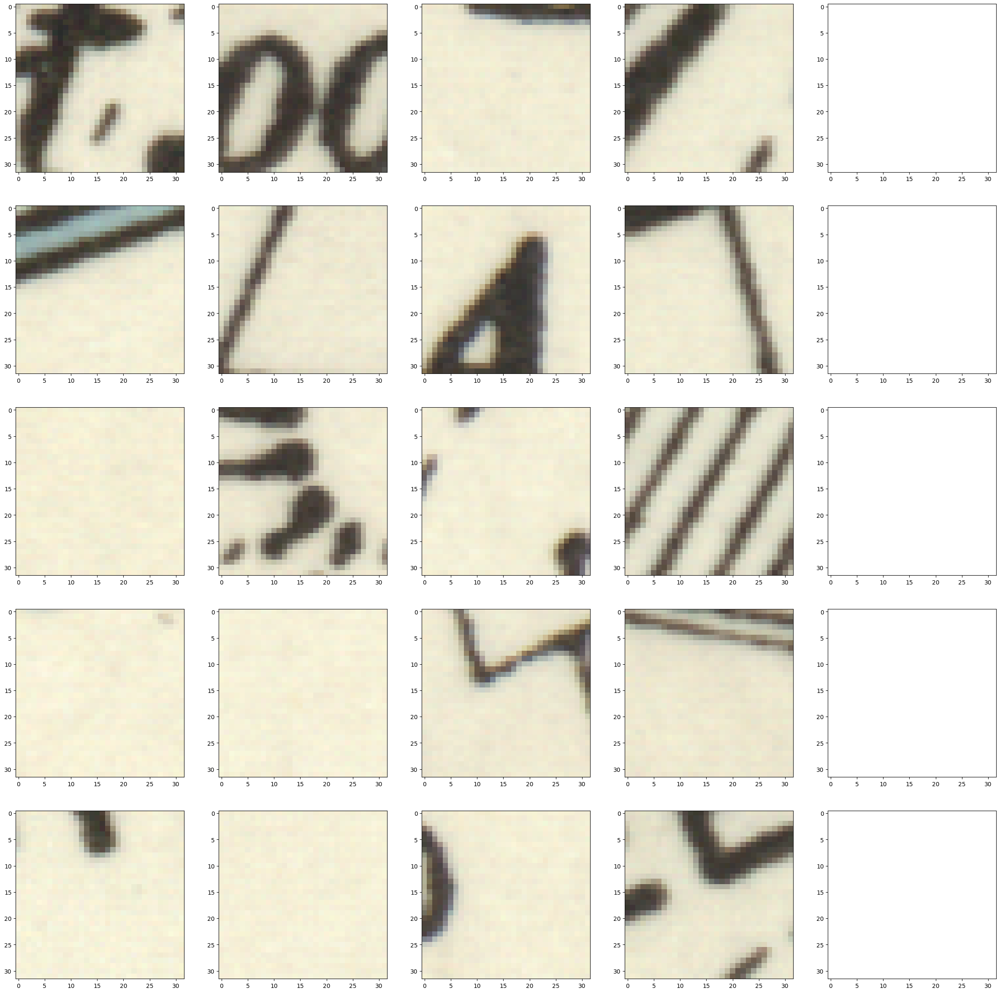

In [124]:
plot_map_patches("data/test_map.tif", 32, 5)

Patches generated with shape: (184, 264, 1, 64, 64, 3)


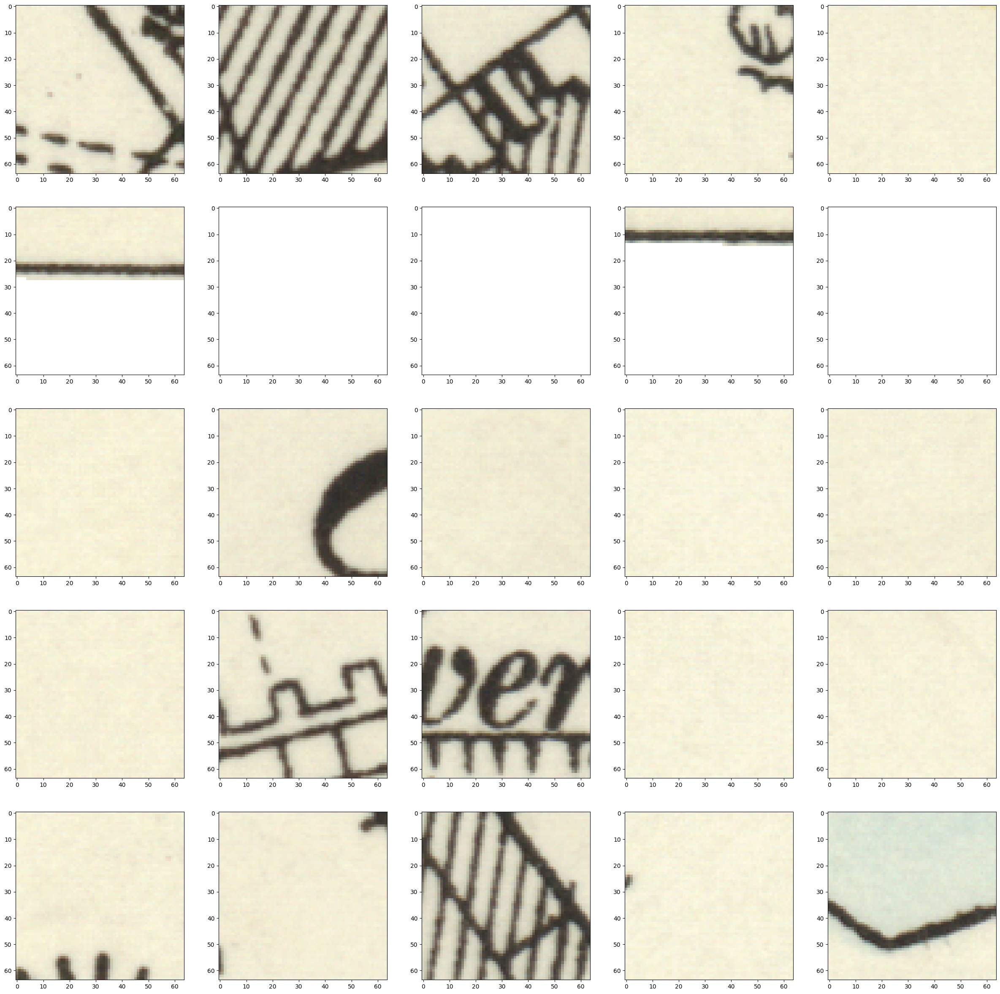

In [125]:
plot_map_patches("data/test_map.tif", 64, 5)

Patches generated with shape: (46, 66, 1, 256, 256, 3)


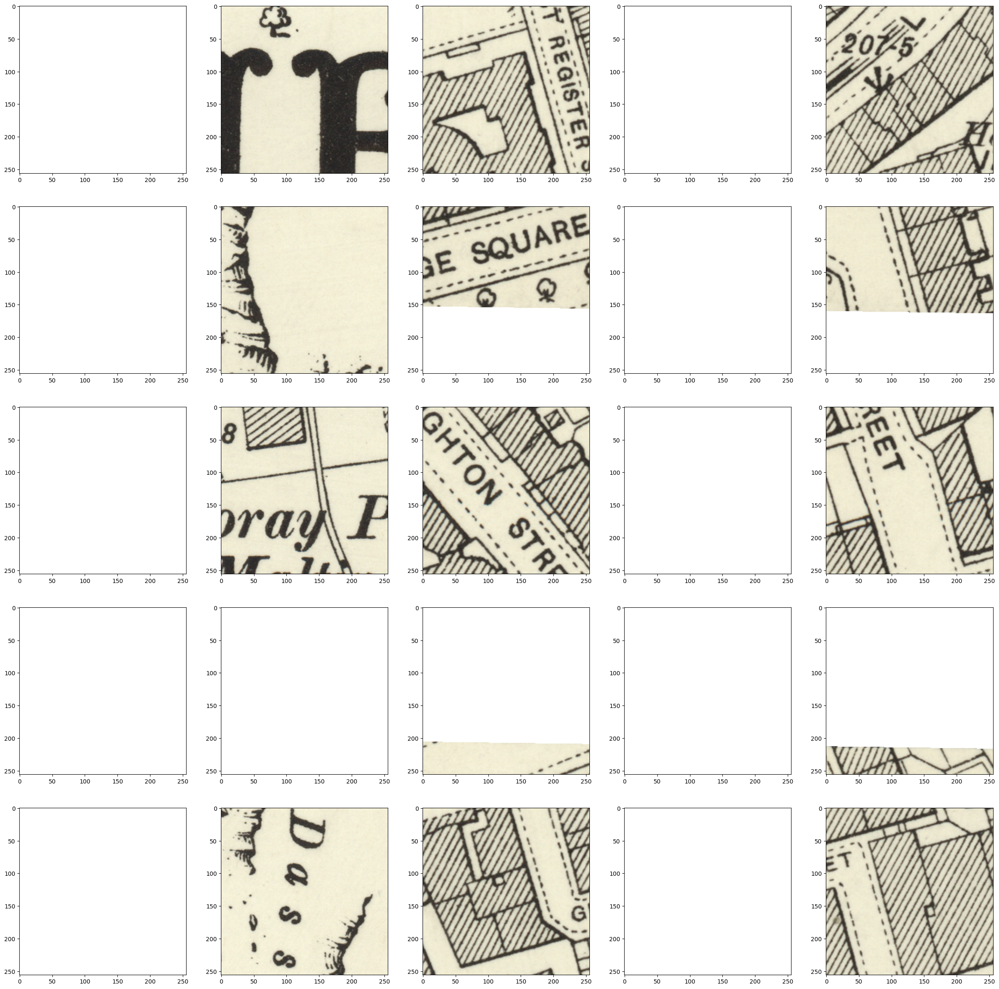

In [126]:
plot_map_patches("data/test_map.tif", 256, 5)

Patches generated with shape: (11, 16, 1, 1024, 1024, 3)


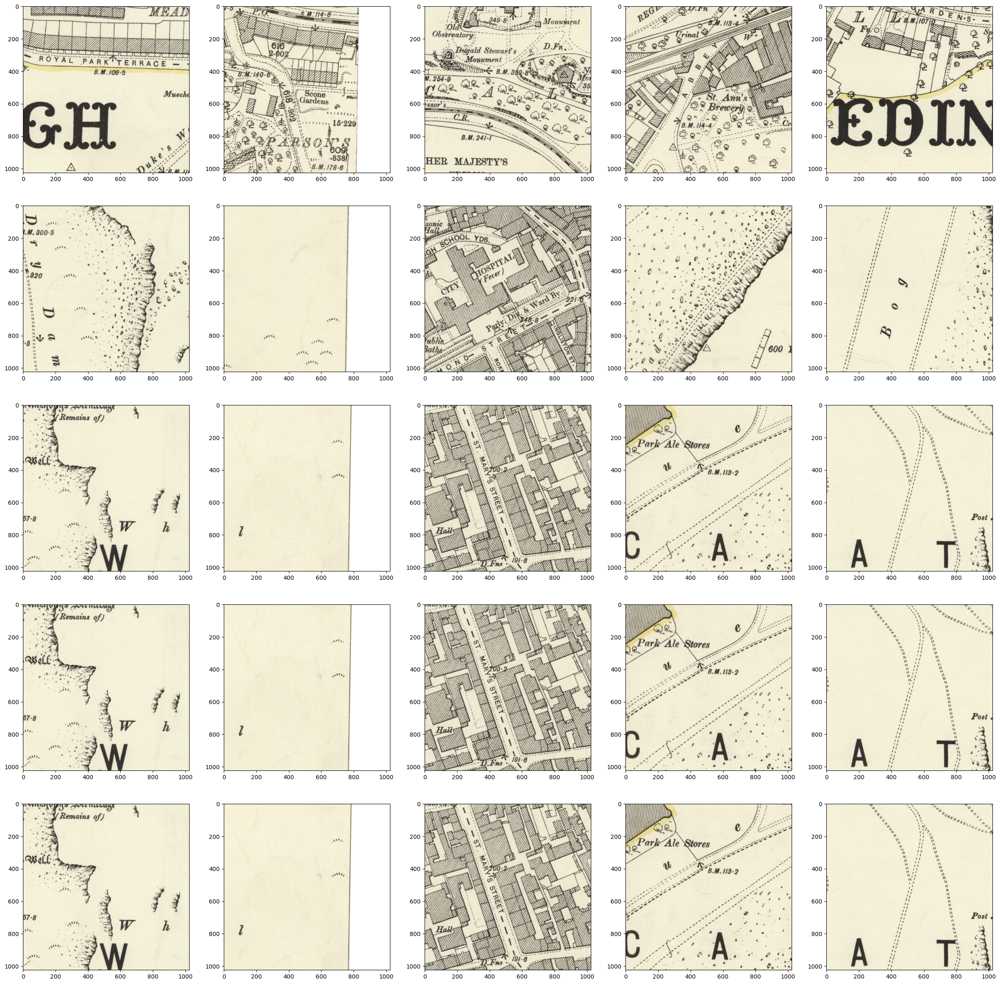

In [127]:
plot_map_patches("data/test_map.tif", 1024, 5)